## State Farm Distracted Driver Detection

### Can computer vision spot distracted drivers?


## Team: 
### 1. Omar Ahmed Mohamed Ahmed 
### 2. Asmaa Saeed 
### 3. Mohamed Salama 
### 4. Alaa Elawady 
### 5. Fatema Samir

Downloading Data

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files

files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list

Saving kaggle.json to kaggle.json
ref                                                                title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
victorsoeiro/netflix-tv-shows-and-movies                           Netflix TV Shows and Movies                           2MB  2022-05-15 00:01:23          14238        410  1.0              
zusmani/petrolgas-prices-worldwide                                 Petrol/Gas Prices Worldwide                          10KB  2022-06-24 01:25:33           1601         82  1.0              
ruchi798/data-science-job-salaries                                 Data Science Job Salaries                             7KB  2022-06-15 08:59:12           2781         90  1.0              
devansodari

In [ ]:
! kaggle competitions download -c State-Farm-Distracted-Driver-Detection

100% 3.99G/4.00G [00:21<00:00, 281MB/s]
100% 4.00G/4.00G [00:21<00:00, 196MB/s]


In [ ]:
! mkdir data
! unzip State-Farm-Distracted-Driver-Detection.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/imgs/train/c7/img_56636.jpg  
  inflating: data/imgs/train/c7/img_56661.jpg  
  inflating: data/imgs/train/c7/img_56699.jpg  
  inflating: data/imgs/train/c7/img_56717.jpg  
  inflating: data/imgs/train/c7/img_56724.jpg  
  inflating: data/imgs/train/c7/img_56768.jpg  
  inflating: data/imgs/train/c7/img_56779.jpg  
  inflating: data/imgs/train/c7/img_56849.jpg  
  inflating: data/imgs/train/c7/img_56899.jpg  
  inflating: data/imgs/train/c7/img_56938.jpg  
  inflating: data/imgs/train/c7/img_5706.jpg  
  inflating: data/imgs/train/c7/img_57076.jpg  
  inflating: data/imgs/train/c7/img_57122.jpg  
  inflating: data/imgs/train/c7/img_57137.jpg  
  inflating: data/imgs/train/c7/img_5715.jpg  
  inflating: data/imgs/train/c7/img_57278.jpg  
  inflating: data/imgs/train/c7/img_57321.jpg  
  inflating: data/imgs/train/c7/img_57345.jpg  
  inflating: data/imgs/train/c7/img_57355.jpg  
  inflating: data/imgs/train/c7/img_574

In [ ]:

train_dir='/content/data/imgs/train'
validation_dir ='/content/data/imgs/validation'


Creating Validation Data

In [ ]:
import os, shutil
base_dir='/content/data/imgs'
validation_dir = os.path.join(base_dir, 'validation')
try:
  os.mkdir(validation_dir)
except:
  pass   

In [ ]:
# Directory with our validation cat pictures
for i in range(10):
    validation_cats_dir = os.path.join(validation_dir, 'c'+str(i))
    try:
        os.mkdir(validation_cats_dir)
    except:
        pass 





In [ ]:
import os
folder = os.listdir('/content/data/imgs/train/c0')
len(folder)

2489

Mving 200 files to validation folder

In [ ]:
import os
import shutil
for i in range(10):
    source = r'/content/data/imgs/train/c'+str(i)                # files location
    destination = r'/content/data/imgs/validation/c'+str(i)            # where to move to 
    folder = os.listdir(source)               # returns a list with all the files in source                    # True if there are any files, False if empty lis
    for i in range(200):                     # 5 files at a time 
            file = folder[0]                    # select the first file's name
            curr_file = source + '/' + file    # creates a string - full path to the file
            shutil.move(curr_file, destination) # move the files
            folder.pop(0)                       # Remove the moved file from the list

In [ ]:
#source = '/content/data/imgs/train/c'+str(0)                # files location           # where to move to 
#folder = os.listdir(source)
#len(folder)

In [ ]:
#source = '/content/data/imgs/validation/c'+str(0)                # files location           # where to move to 
#folder = os.listdir(source)
#len(folder)

In [ ]:
#shutil.rmtree('/content/data/imgs/validation/c'+str(0) )

In [ ]:
import os
import shutil
alltrain=0
for i in range(10):
     source = '/content/data/imgs/train/c'+str(i)                    
     folder = os.listdir(source)
     print("train ",str(i )+" : ",len(folder))
     alltrain +=  len(folder)
print("all training data : ",alltrain)    

train  0 :  2289
train  1 :  2067
train  2 :  2117
train  3 :  2146
train  4 :  2126
train  5 :  2112
train  6 :  2125
train  7 :  1802
train  8 :  1711
train  9 :  1929
all training data :  20424


In [ ]:
allval=0
for i in range(10):
     source = '/content/data/imgs/validation/c'+str(i)                    
     folder = os.listdir(source)
     print("train ",str(i )+" : ",len(folder))
     allval +=  len(folder)
print("all training data : ",allval)      

train  0 :  200
train  1 :  200
train  2 :  200
train  3 :  200
train  4 :  200
train  5 :  200
train  6 :  200
train  7 :  200
train  8 :  200
train  9 :  200
all training data :  2000


 ## Baseline Dense layers model

In [ ]:
from tensorflow.keras import models
from tensorflow.keras import layers
import tensorflow as tf

model = models.Sequential()
model.add(tf.keras.layers.Reshape((150*150*3,), input_shape=(150,150,3)))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_1 (Reshape)         (None, 67500)             0         
                                                                 
 dense_8 (Dense)             (None, 512)               34560512  
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                                 
 dense_10 (Dense)            (None, 128)               32896     
                                                                 
 dense_11 (Dense)            (None, 10)                1290      
                                                                 
Total params: 34,726,026
Trainable params: 34,726,026
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from tensorflow.keras import optimizers

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['acc'])

## Data

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=24,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 20424 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [ ]:
#import os
#dir = os.listdir('/content/data/imgs/validation')
#print(dir)

In [ ]:
#file_path = ('/content/data/imgs/validation/.ipynb_checkpoints')
#os.rmdir(file_path)

In [ ]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

for data_batch, labels_batch in validation_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break    

data batch shape: (24, 150, 150, 3)
labels batch shape: (24, 10)
data batch shape: (20, 150, 150, 3)
labels batch shape: (20, 10)


In [ ]:

history = model.fit(
      train_generator,
      steps_per_epoch=851,
      epochs=6,
      validation_data=validation_generator,
      validation_steps=100
      )

Epoch 1/6
851/851 [==============================] - 310s 363ms/step - loss: 1.7695 - acc: 0.6313 - val_loss: 0.5661 - val_acc: 0.8125
Epoch 2/6
851/851 [==============================] - 314s 369ms/step - loss: 0.3469 - acc: 0.8894 - val_loss: 0.8845 - val_acc: 0.7845
Epoch 3/6
851/851 [==============================] - 309s 363ms/step - loss: 0.2704 - acc: 0.9125 - val_loss: 0.2736 - val_acc: 0.9065
Epoch 4/6
851/851 [==============================] - 318s 374ms/step - loss: 0.1548 - acc: 0.9495 - val_loss: 0.1402 - val_acc: 0.9505
Epoch 5/6
851/851 [==============================] - 301s 353ms/step - loss: 0.1690 - acc: 0.9459 - val_loss: 0.2151 - val_acc: 0.9275
Epoch 6/6
851/851 [==============================] - 302s 354ms/step - loss: 0.1443 - acc: 0.9536 - val_loss: 0.2475 - val_acc: 0.9230


In [ ]:
model.save('gdrive/My Drive/DeepLearningModel1.h5')

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_1 (Reshape)         (None, 67500)             0         
                                                                 
 dense_8 (Dense)             (None, 512)               34560512  
                                                                 
 dense_9 (Dense)             (None, 256)               131328    
                                                                 
 dense_10 (Dense)            (None, 128)               32896     
                                                                 
 dense_11 (Dense)            (None, 10)                1290      
                                                                 
Total params: 34,726,026
Trainable params: 34,726,026
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
from tensorflow.keras.models import load_model
model = load_model('gdrive/My Drive/DeepLearningModel1.h5')

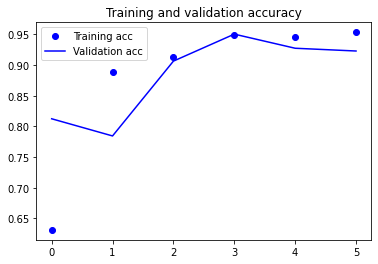

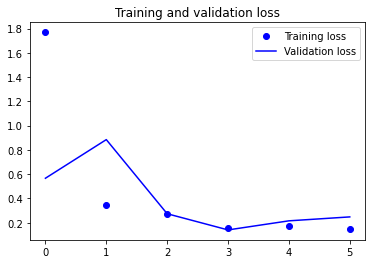

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

##  Baseline CNN model

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import models

model2 = models.Sequential()
model2.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))
model2.add(layers.Flatten())
model2.add(layers.Dense(512, activation='relu'))
model2.add(layers.Dense(10, activation='softmax'))

In [ ]:
from tensorflow.keras import optimizers

model2.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
history2 = model2.fit(
      train_generator,
      steps_per_epoch=851,
      epochs=3,
      validation_data=validation_generator,
      validation_steps=100
      )

Epoch 1/3
851/851 [==============================] - 113s 129ms/step - loss: 0.8274 - acc: 0.7306 - val_loss: 0.1969 - val_acc: 0.9525
Epoch 2/3
851/851 [==============================] - 109s 128ms/step - loss: 0.1250 - acc: 0.9654 - val_loss: 0.1497 - val_acc: 0.9580
Epoch 3/3
851/851 [==============================] - 108s 127ms/step - loss: 0.0559 - acc: 0.9836 - val_loss: 0.0691 - val_acc: 0.9830


In [ ]:
model2.save('gdrive/My Drive/DeepLearningModel2.h5')

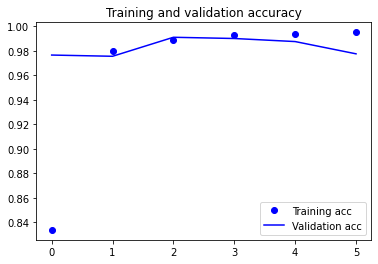

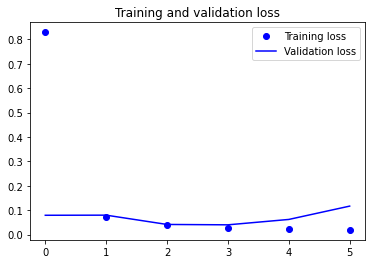

In [ ]:
import matplotlib.pyplot as plt

acc = history2.history['acc']
val_acc = history2.history['val_acc']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

till now it seems like we have great models with great train and validation accuracy .  

## Data augmentation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1/255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=24,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 20424 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [ ]:
history3 = model2.fit_generator(
      train_generator,
      steps_per_epoch=851,
      epochs=14,
      validation_data=validation_generator,
      validation_steps=100)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/14
851/851 [==============================] - 190s 223ms/step - loss: 1.1537 - acc: 0.6077 - val_loss: 0.5602 - val_acc: 0.8105
Epoch 2/14
851/851 [==============================] - 191s 224ms/step - loss: 1.0577 - acc: 0.6407 - val_loss: 0.6138 - val_acc: 0.7900
Epoch 3/14
851/851 [==============================] - 190s 223ms/step - loss: 0.9933 - acc: 0.6643 - val_loss: 0.5124 - val_acc: 0.8300
Epoch 4/14
851/851 [==============================] - 189s 222ms/step - loss: 0.9212 - acc: 0.6890 - val_loss: 0.4366 - val_acc: 0.8620
Epoch 5/14
851/851 [==============================] - 191s 224ms/step - loss: 0.8653 - acc: 0.7092 - val_loss: 0.4275 - val_acc: 0.8495
Epoch 6/14
851/851 [==============================] - 190s 223ms/step - loss: 0.8135 - acc: 0.7269 - val_loss: 0.4140 - val_acc: 0.8640
Epoch 7/14
851/851 [==============================] - 190s 223ms/step - loss: 0.7809 - acc: 0.7360 - val_loss: 0.3871 - val_acc: 0.8705
Epoch 8/14
851/851 [============================

In [ ]:
model2.save('gdrive/My Drive/DeepLearningModel3.h5')

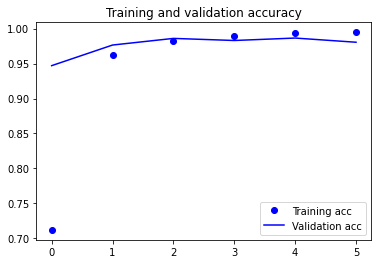

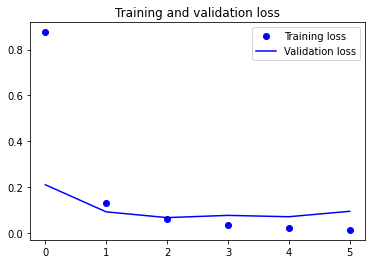

In [ ]:
import matplotlib.pyplot as plt

acc = history2.history['acc']
val_acc = history2.history['val_acc']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()


##  Transfer Learning

In [ ]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [ ]:
conv_base.trainable =   False



In [ ]:
from tensorflow.keras import models
from tensorflow.keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 32)                262176    
                                                                 
 dense_1 (Dense)             (None, 10)                330       
                                                                 
Total params: 14,977,194
Trainable params: 262,506
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
from tensorflow.keras import optimizers

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.imagenet_utils import preprocess_input

train_datagen = ImageDataGenerator(
      #rescale=1./255,
      preprocessing_function=preprocess_input,
      #rotation_range=40, 
      #width_shift_range=0.2,
      #height_shift_range=0.2,
      #shear_range=0.2,
      #zoom_range=0.2,
      #horizontal_flip=True,
      #fill_mode='nearest'
      )

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)#rescale=1./255) # Issue: https://github.com/fchollet/deep-learning-with-python-notebooks/issues/21

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=24,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')



Found 20424 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


In [ ]:
history3 = model.fit_generator(
      train_generator,
      steps_per_epoch=851,
      epochs=7,
      validation_data=validation_generator,
      validation_steps=100)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/7
851/851 [==============================] - 136s 144ms/step - loss: 1.5703 - acc: 0.5472 - val_loss: 0.5639 - val_acc: 0.8470
Epoch 2/7
851/851 [==============================] - 119s 140ms/step - loss: 0.2697 - acc: 0.9272 - val_loss: 0.2278 - val_acc: 0.9410
Epoch 3/7
851/851 [==============================] - 120s 141ms/step - loss: 0.0925 - acc: 0.9761 - val_loss: 0.1467 - val_acc: 0.9715
Epoch 4/7
851/851 [==============================] - 120s 141ms/step - loss: 0.0364 - acc: 0.9910 - val_loss: 0.0965 - val_acc: 0.9790
Epoch 5/7
851/851 [==============================] - 120s 141ms/step - loss: 0.0162 - acc: 0.9956 - val_loss: 0.1013 - val_acc: 0.9830
Epoch 6/7
851/851 [==============================] - 120s 141ms/step - loss: 0.0094 - acc: 0.9976 - val_loss: 0.0972 - val_acc: 0.9835
Epoch 7/7
851/851 [==============================] - 119s 140ms/step - loss: 0.0039 - acc: 0.9988 - val_loss: 0.0907 - val_acc: 0.9855


In [ ]:
model.save('gdrive/My Drive/DeepLearningModel3.h5')

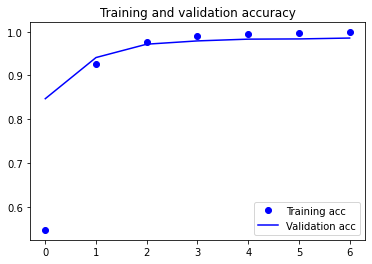

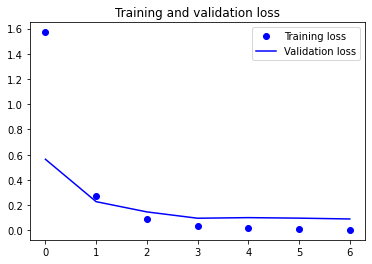

In [ ]:
import matplotlib.pyplot as plt

acc = history3.history['acc']
val_acc = history3.history['val_acc']
loss = history3.history['loss']
val_loss = history3.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## CNN visualization

In [ ]:
from tensorflow.keras.models import load_model

#model = load_model('/content/DeepLearningModel2')
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [ ]:
img_path = '/content/data/imgs/validation/c0/img_10003.jpg'

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


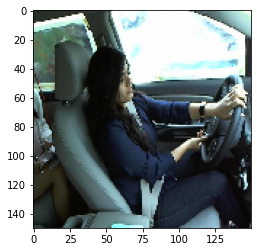

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In [ ]:
from tensorflow.keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model2.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model2.input, outputs=layer_outputs)
activation_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856 

In [ ]:
activations = activation_model.predict(img_tensor)
len(activations)

8

(1, 148, 148, 32)


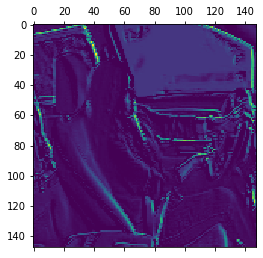

In [ ]:
##example
import matplotlib.pyplot as plt
first_layer_activation = activations[0]
print(first_layer_activation.shape)
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


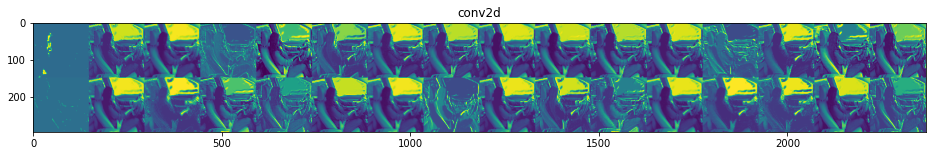

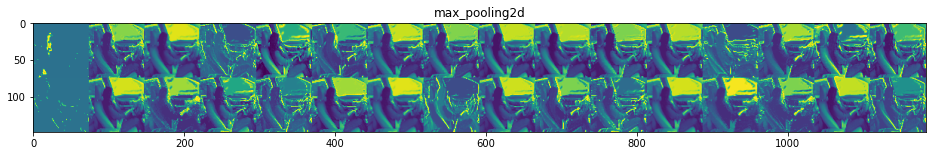

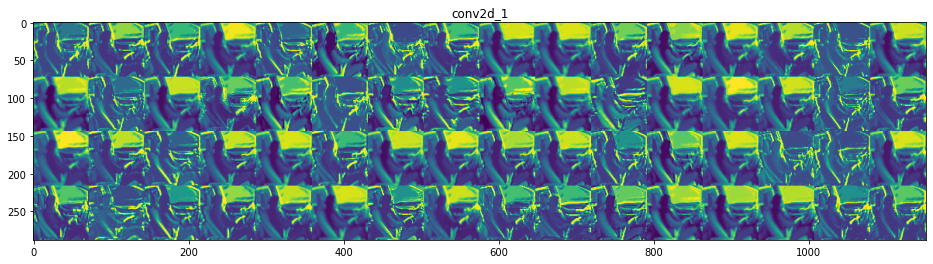

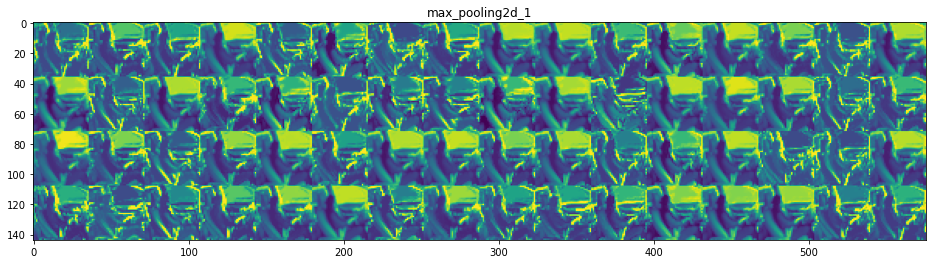

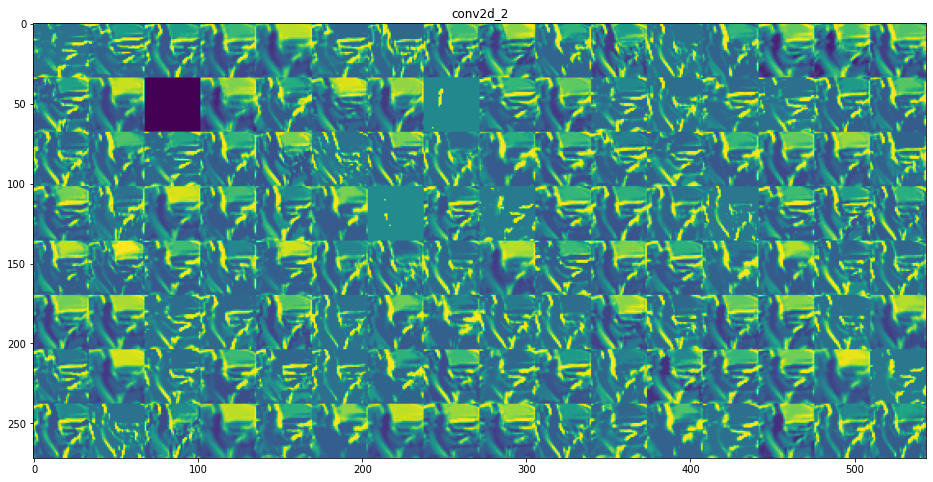

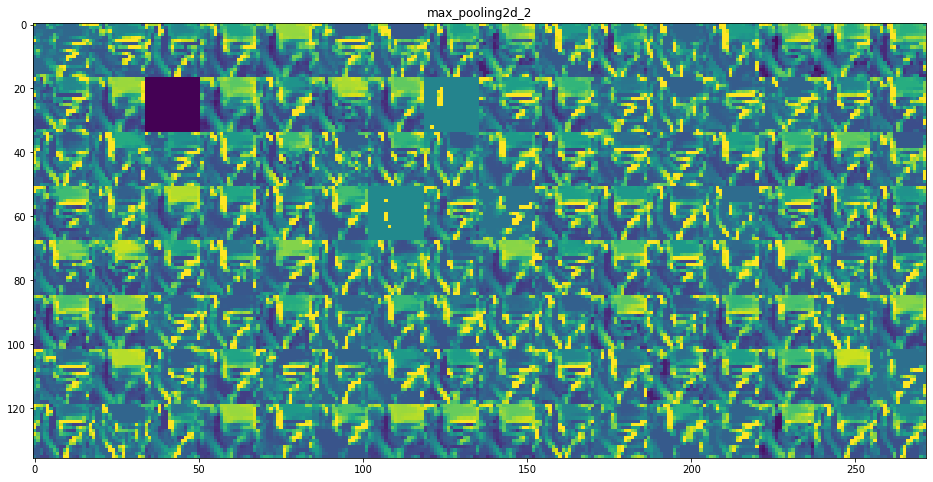

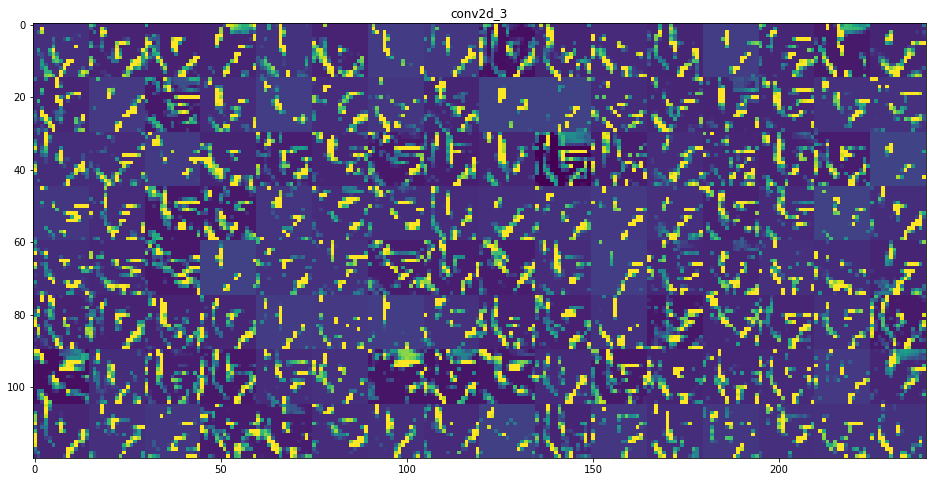

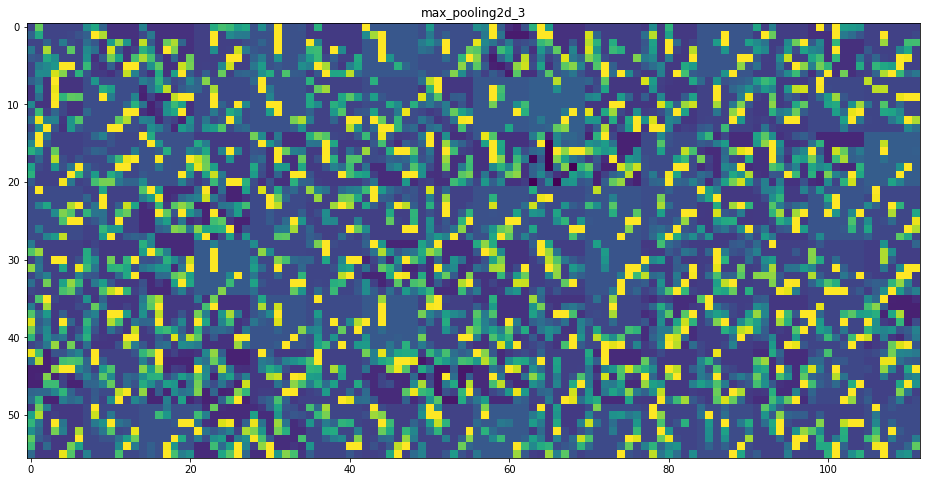

In [ ]:
import tensorflow.keras as keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model2.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

## Visualising the filters

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet',
              include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

58900480/58889256 [==============================] - 0s 0us/step


In [ ]:
grads = K.gradients(loss, model.input)[0]

In [ ]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [ ]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [ ]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [ ]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    #x *= 255
    #x = np.clip(x, 0, 255).astype('uint8')
    return x

In [ ]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

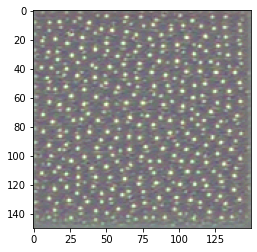

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

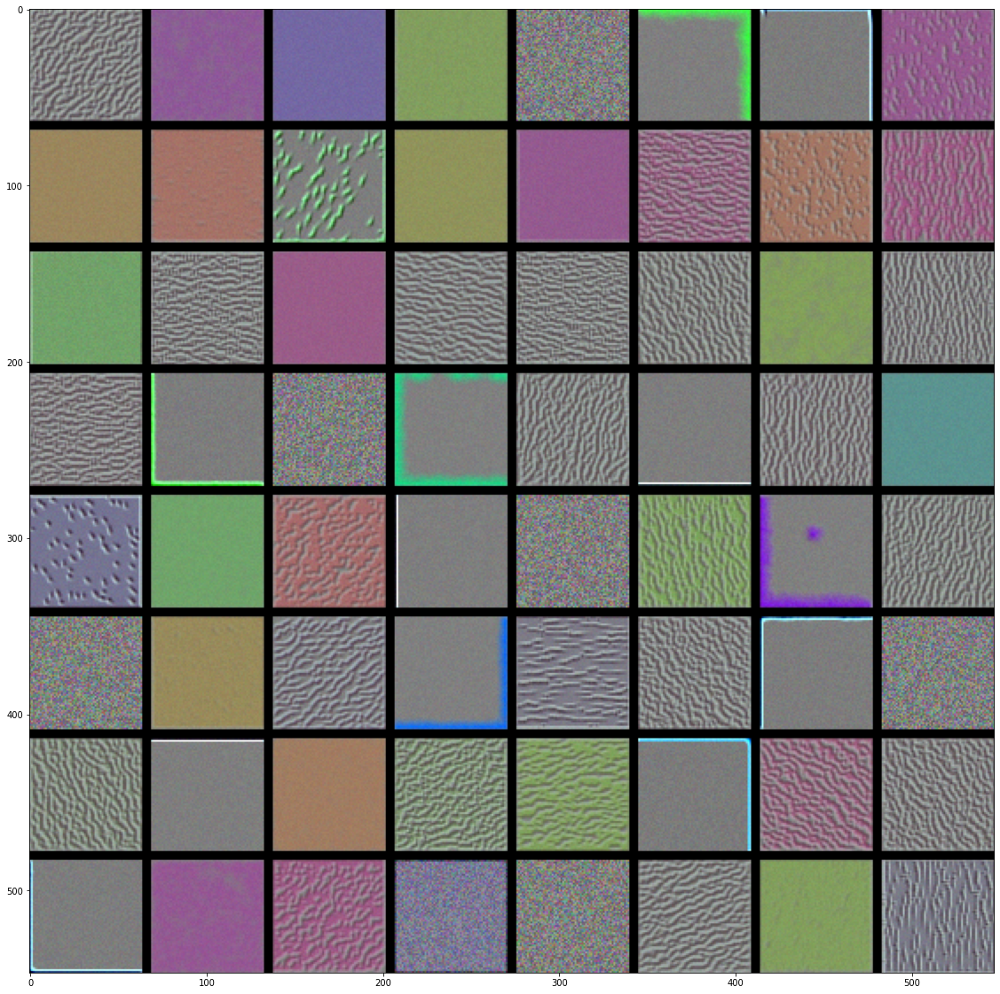

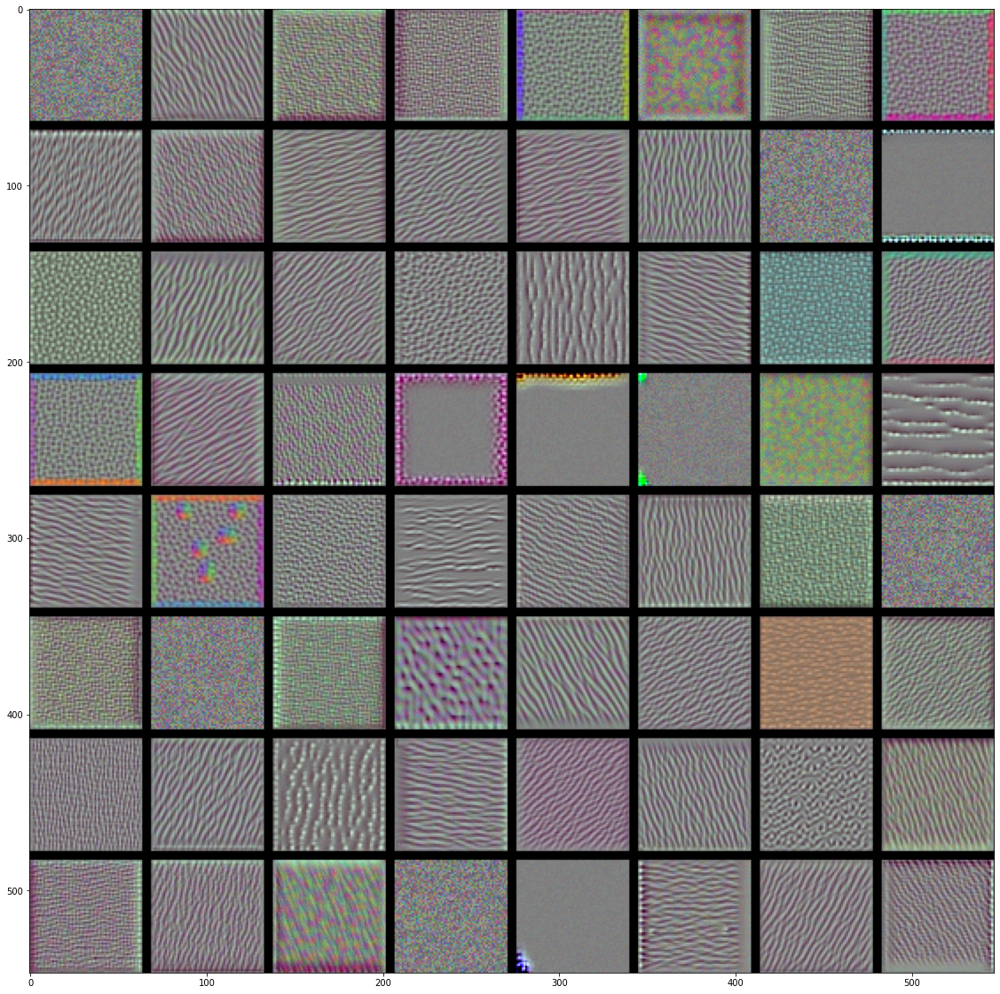

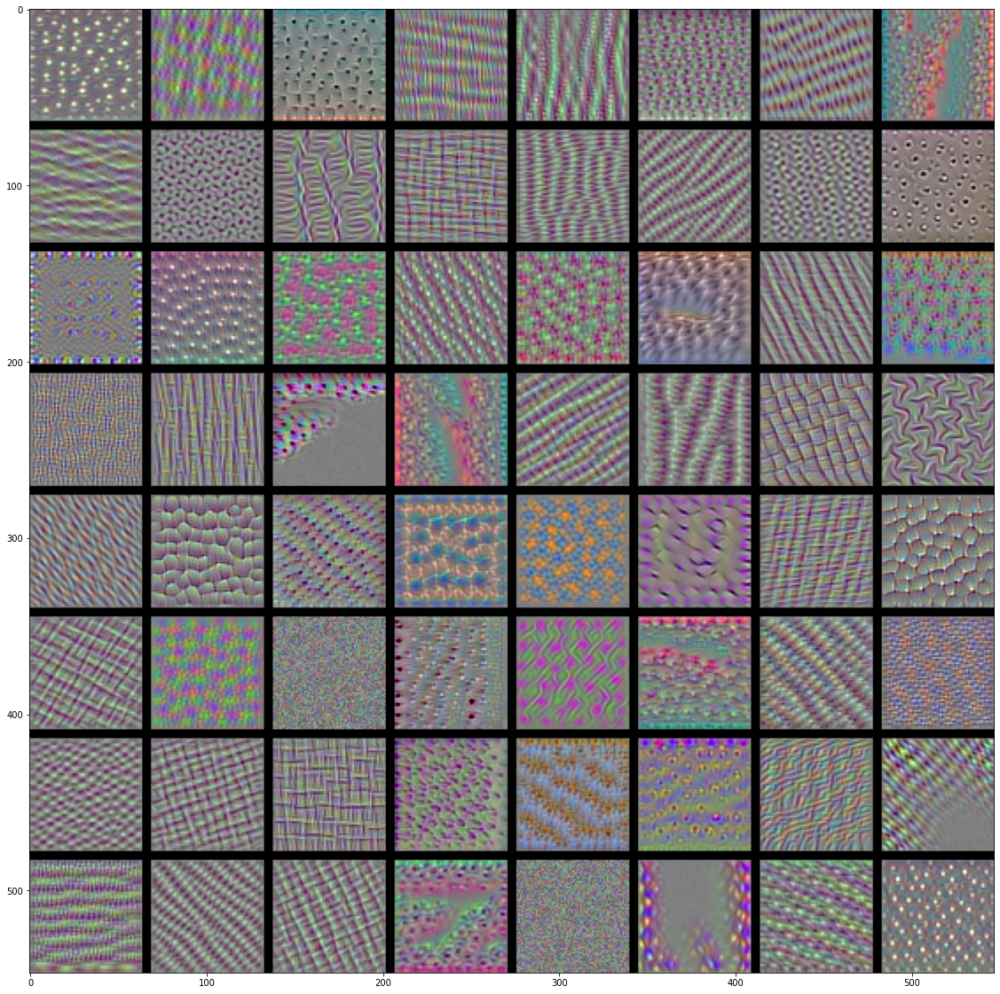

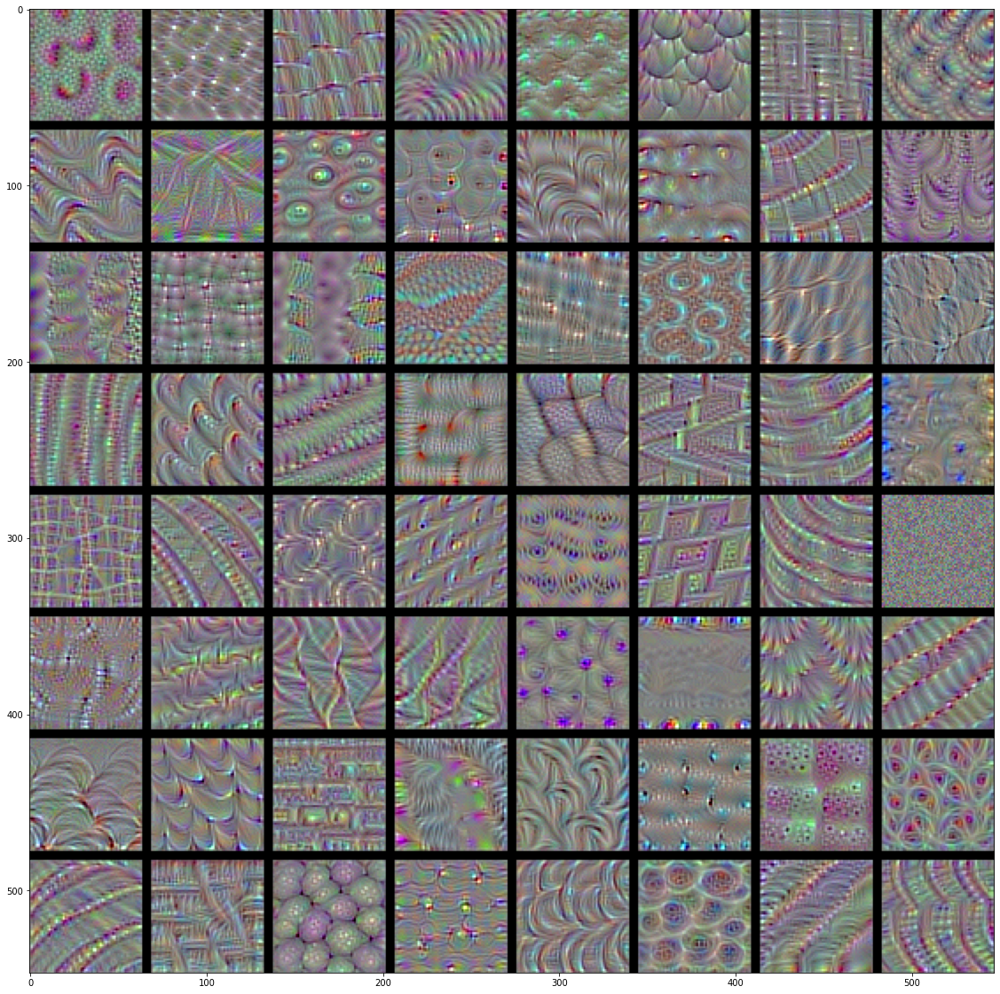

In [ ]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

## Grad-CAM

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
import tensorflow.keras.backend as K

K.clear_session()

# Note that we are including the densely-connected classifier on top;
# all previous times, we were discarding it.
model = VGG16(weights='imagenet')

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# The local path to our target image
img_path = '/content/data/imgs/validation/c0/img_100026.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

In [ ]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n04162706', 'seat_belt', 0.49772006), ('n03868863', 'oxygen_mask', 0.04889813), ('n04200800', 'shoe_shop', 0.03622296)]


/usr/local/lib/python3.7/dist-packages/keras/engine/training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
np.argmax(preds[0])

785

In [ ]:
# This is the "african elephant" entry in the prediction vector
african_elephant_output = model.output[:, 785]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('block5_conv3')

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

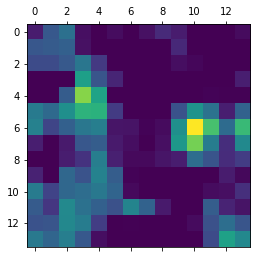

In [ ]:
import matplotlib.pyplot as plt
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [ ]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('elephant_cam.jpg', superimposed_img)

True

In [ ]:
img_path = '/content/elephant_cam.jpg'

# We preprocess the image into a 4D tensor
from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


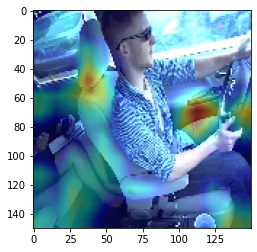

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()